# Style Transfer, Yolo, Embeddings

In this lab, you will work on the following concepts.

- Style transfer
- Yolo
- Embeddings

In [ ]:
# portions of this lab were taken from Deep Learning with Python

import glob
import os
import random
import shutil

import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import *

import matplotlib.pyplot as plt
%matplotlib inline

import pandas as pd

import numpy as np
from random import shuffle
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler
!pip install umap-learn
import umap

print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))

2.18.0
[]


# 1. Neural Style Transfer

Execute the neural style transfer algorithm on an Santa Clara University image to generate a GIF of the different generations of the picture.

https://keras.io/examples/generative/neural_style_transfer/

Example of style images are provided in the styles directory. These images usually produce good results in style transfer.

<img src='rio-de-janeiro.jpeg'>

With neural style transfer.

<img src='rj_rf_at_iteration_4.png'>

Read the code from Keras, execute it to generate images, and explain in your words how Neural Style Transfer works.  You should utilize ChatGPT or equivalent to help you write the summary.

In [ ]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"

import keras
import numpy as np
import tensorflow as tf
from keras.applications import vgg19

#base_image_path = keras.utils.get_file("paris.jpg", "https://i.imgur.com/F28w3Ac.jpg")
#style_reference_image_path = keras.utils.get_file(
    #"starry_night.jpg", "https://i.imgur.com/9ooB60I.jpg"
#)
result_prefix = "paris_generated"

# Weights of the different loss components
total_variation_weight = 1e-6
style_weight = 1e-6
content_weight = 2.5e-8

# Dimensions of the generated picture.
width, height = keras.utils.load_img("img1.jpg").size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

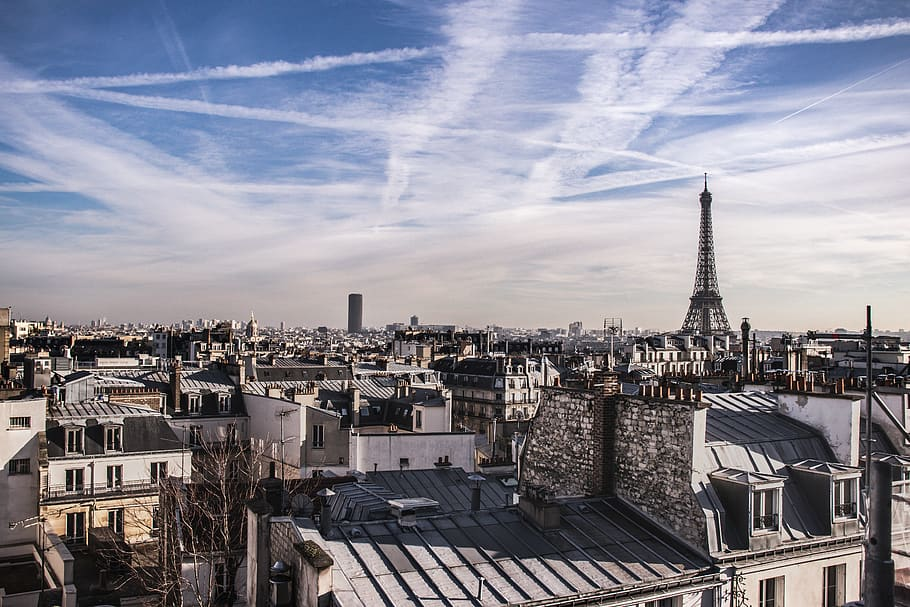

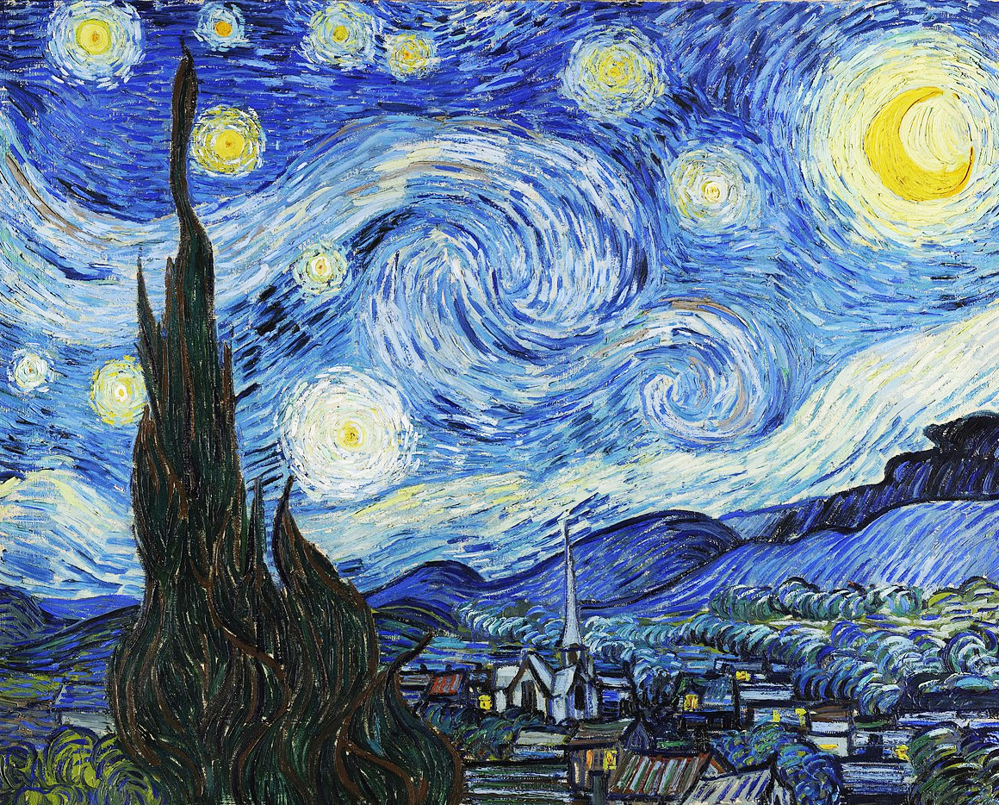

In [ ]:
from IPython.display import Image, display

display(Image("img1.jpg"))
display(Image("starry_night.jpg"))

In [ ]:
def preprocess_image(image_path):
    # Util function to open, resize and format pictures into appropriate tensors
    img = keras.utils.load_img(image_path, target_size=(img_nrows, img_ncols))
    img = keras.utils.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return tf.convert_to_tensor(img)


def deprocess_image(x):
    # Util function to convert a tensor into a valid image
    x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype("uint8")
    return x

# The gram matrix of an image tensor (feature-wise outer product)


def gram_matrix(x):
    x = tf.transpose(x, (2, 0, 1))
    features = tf.reshape(x, (tf.shape(x)[0], -1))
    gram = tf.matmul(features, tf.transpose(features))
    return gram


# The "style loss" is designed to maintain
# the style of the reference image in the generated image.
# It is based on the gram matrices (which capture style) of
# feature maps from the style reference image
# and from the generated image


def style_loss(style, combination):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return tf.reduce_sum(tf.square(S - C)) / (4.0 * (channels**2) * (size**2))


# An auxiliary loss function
# designed to maintain the "content" of the
# base image in the generated image


def content_loss(base, combination):
    return tf.reduce_sum(tf.square(combination - base))


# The 3rd loss function, total variation loss,
# designed to keep the generated image locally coherent


def total_variation_loss(x):
    a = tf.square(
        x[:, : img_nrows - 1, : img_ncols - 1, :] - x[:, 1:, : img_ncols - 1, :]
    )
    b = tf.square(
        x[:, : img_nrows - 1, : img_ncols - 1, :] - x[:, : img_nrows - 1, 1:, :]
    )
    return tf.reduce_sum(tf.pow(a + b, 1.25))

In [ ]:
# Build a VGG19 model loaded with pre-trained ImageNet weights
model = vgg19.VGG19(weights="imagenet", include_top=False)

# Get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

# Set up a model that returns the activation values for every layer in
# VGG19 (as a dict).
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# List of layers to use for the style loss.
style_layer_names = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
]
# The layer to use for the content loss.
content_layer_name = "block5_conv2"


def compute_loss(combination_image, base_image, style_reference_image):
    input_tensor = tf.concat(
        [base_image, style_reference_image, combination_image], axis=0
    )
    features = feature_extractor(input_tensor)

    # Initialize the loss
    loss = tf.zeros(shape=())

    # Add content loss
    layer_features = features[content_layer_name]
    base_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]
    loss = loss + content_weight * content_loss(
        base_image_features, combination_features
    )
    # Add style loss
    for layer_name in style_layer_names:
        layer_features = features[layer_name]
        style_reference_features = layer_features[1, :, :, :]
        combination_features = layer_features[2, :, :, :]
        sl = style_loss(style_reference_features, combination_features)
        loss += (style_weight / len(style_layer_names)) * sl

    # Add total variation loss
    loss += total_variation_weight * total_variation_loss(combination_image)
    return loss

In [ ]:
@tf.function
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss = compute_loss(combination_image, base_image, style_reference_image)
    grads = tape.gradient(loss, combination_image)
    return loss, grads

In [ ]:
optimizer = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96
    )
)

base_image = preprocess_image("img1.jpg")
style_reference_image = preprocess_image("starry_night.jpg")
combination_image = tf.Variable(preprocess_image("img1.jpg"))

iterations = 4000
for i in range(1, iterations + 1):
    loss, grads = compute_loss_and_grads(
        combination_image, base_image, style_reference_image
    )
    optimizer.apply_gradients([(grads, combination_image)])
    if i % 100 == 0:
        print("Iteration %d: loss=%.2f" % (i, loss))
        img = deprocess_image(combination_image.numpy())
        fname = result_prefix + "_at_iteration_%d.png" % i
        keras.utils.save_img(fname, img)

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(3, 400, 599, 3))
  warnings.warn(msg)


Iteration 100: loss=11024.39
Iteration 200: loss=8518.92
Iteration 300: loss=7574.12
Iteration 400: loss=7063.47
Iteration 500: loss=6734.36
Iteration 600: loss=6499.05
Iteration 700: loss=6320.12
Iteration 800: loss=6177.91
Iteration 900: loss=6061.31
Iteration 1000: loss=5963.73
Iteration 1100: loss=5880.71
Iteration 1200: loss=5809.39
Iteration 1300: loss=5747.38
Iteration 1400: loss=5692.90
Iteration 1500: loss=5644.64
Iteration 1600: loss=5601.51
Iteration 1700: loss=5562.79
Iteration 1800: loss=5527.95
Iteration 1900: loss=5496.42
Iteration 2000: loss=5467.84
Iteration 2100: loss=5441.82
Iteration 2200: loss=5418.04
Iteration 2300: loss=5396.26
Iteration 2400: loss=5376.13
Iteration 2500: loss=5357.61
Iteration 2600: loss=5340.49
Iteration 2700: loss=5324.62
Iteration 2800: loss=5309.91
Iteration 2900: loss=5296.23
Iteration 3000: loss=5283.48
Iteration 3100: loss=5271.58
Iteration 3200: loss=5260.47
Iteration 3300: loss=5250.08
Iteration 3400: loss=5240.34
Iteration 3500: loss=5

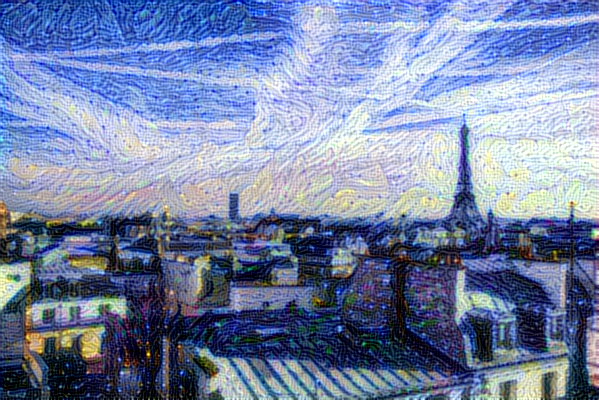

In [ ]:
display(Image(result_prefix + "_at_iteration_4000.png"))

**Summary of Neural Style Transfer**

Neural Style Transfer works by optimizing a randomized image so that it retains the content of one image and the style of a different image. This is done by using a pretrained CNN, like VGG, to extract the features of both the content image and the style image.

The content of the content image is extracted from the deeper levels of CNN, as this is where the higher-level features, like shapes and edges, are stored. The style of the style image is extracted by using the Gram matrices of activations from different layers.

Once both content and style have been extracted from their respective images, they are converted into loss, and combined to form this equation:

$𝓛_{total} = \alpha𝓛_{content} + \beta𝓛_{style}$

where $\alpha$ and $\beta$ are constants. This loss function is minimized through gradient descent, with the final image having the content from one image in the style of another image.

# 2. YOLO - Detecting Bananas in Your Hand

In this part of the lab, you will add YOLO to a video stream as given below using cv2 to detect bananas in a video stream.

To install OpenCV, type:

```shell
pip3 install opencv-python
```

## 2.1. Training YOLO To Detect Bananas

You will implement YOLO to detect bananas in images.

<img src='2.png'>

Resources for YOLO can be found in:

https://machinelearningmastery.com/how-to-perform-object-detection-with-yolov3-in-keras/

https://www.analyticsvidhya.com/blog/2018/12/practical-guide-object-detection-yolo-framewor-python/

https://www.analyticsvidhya.com/blog/2018/10/a-step-by-step-introduction-to-the-basic-object-detection-algorithms-part-1/

https://medium.com/@enriqueav/object-detection-with-yolo-implementations-and-how-to-use-them-5da928356035

https://github.com/experiencor/keras-yolo2

The directory bananas-detection contains two directories, bananas-train and bananas_train and bananas_val, and label.csv contains the name of the file and the enclosing box for banana in the image.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

df = pd.read_csv('drive/MyDrive/banana-detection/bananas_train/label.csv')
df

,img_name,label,xmin,ymin,xmax,ymax
0,0.png,0,104,20,143,58
1,1.png,0,68,175,118,223
2,2.png,0,163,173,218,239
3,3.png,0,48,157,84,201
4,4.png,0,32,34,90,86
...,...,...,...,...,...,...
995,995.png,0,171,101,214,147
996,996.png,0,42,57,83,96
997,997.png,0,47,54,86,109
998,998.png,0,43,125,90,166


In [ ]:
import pandas as pd
import os

# Assuming 'df' is your DataFrame from the previous code block
# and the CSV is in the correct path

# Create a directory to store the text files if it doesn't exist
output_dir = "/content/drive/MyDrive/banana-detection/bananas_train/labels"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

df = pd.read_csv('drive/MyDrive/banana-detection/bananas_train/label.csv')

pixel_width, pixel_height = 256, 256

for index, row in df.iterrows():
    filename = row['img_name']
    # Assuming the rest of the columns are the data for the text file
    # Modify the following line based on your actual column names

    x_center = ((row['xmax'] + row['xmin']) / 2) / pixel_width
    y_center = ((row['ymax'] + row['ymin']) / 2) / pixel_height
    width = (row['xmax'] - row['xmin']) / pixel_width
    height = (row['ymax'] - row['ymin']) / pixel_height
    data = f"{row['label']} {x_center} {y_center} {width} {height}"

    # Create the text file path
    filepath = os.path.join(output_dir, filename[:-4] + ".txt") #Change .jpg to .txt

    # Write the data to the text file
    with open(filepath, 'w') as f:
        f.write(data)


In [ ]:
output_dir = "/content/drive/MyDrive/banana-detection/bananas_val/labels"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

df = pd.read_csv('drive/MyDrive/banana-detection/bananas_val/label.csv')

pixel_width, pixel_height = 256, 256

for index, row in df.iterrows():
    filename = row['img_name']
    # Assuming the rest of the columns are the data for the text file
    # Modify the following line based on your actual column names

    x_center = ((row['xmax'] + row['xmin']) / 2) / pixel_width
    y_center = ((row['ymax'] + row['ymin']) / 2) / pixel_height
    width = (row['xmax'] - row['xmin']) / pixel_width
    height = (row['ymax'] - row['ymin']) / pixel_height
    data = f"{row['label']} {x_center} {y_center} {width} {height}"

    # Create the text file path
    filepath = os.path.join(output_dir, filename[:-4] + ".txt") #Change .jpg to .txt

    # Write the data to the text file
    with open(filepath, 'w') as f:
        f.write(data)


In [ ]:
!pip install ultralytics==8.2.103 -q

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.103 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (AMD EPYC 7B12)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 35.6/107.7 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

In [ ]:
!yolo task=detect mode=train model=yolov8n.pt imgsz=256 data=bananas.yaml epochs=50 batch=8 name=yolov8n_bananas

100% 6.25M/6.25M [00:00<00:00, 85.0MB/s]
New https://pypi.org/project/ultralytics/8.3.81 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.103 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=bananas.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=256, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_bananas, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fals

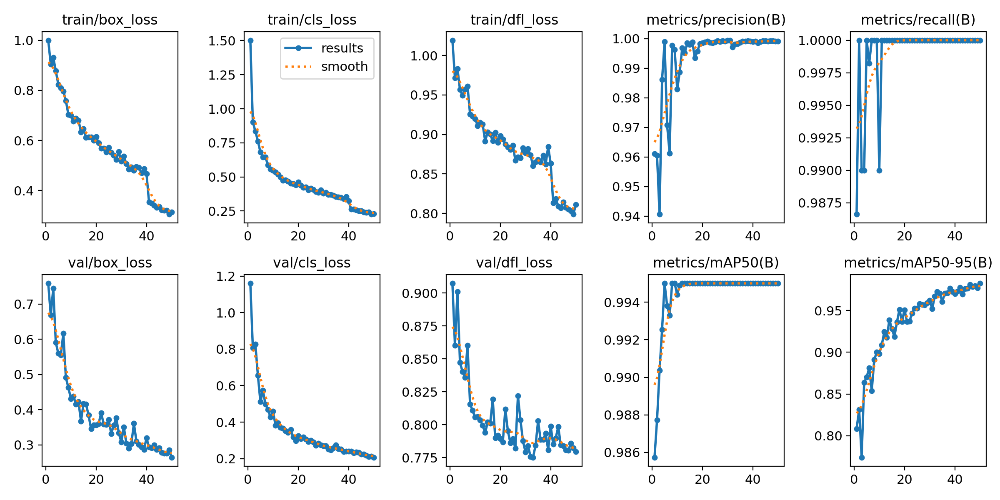

In [ ]:
Image(filename="/content/runs/detect/yolov8n_bananas/results.png", width=600)

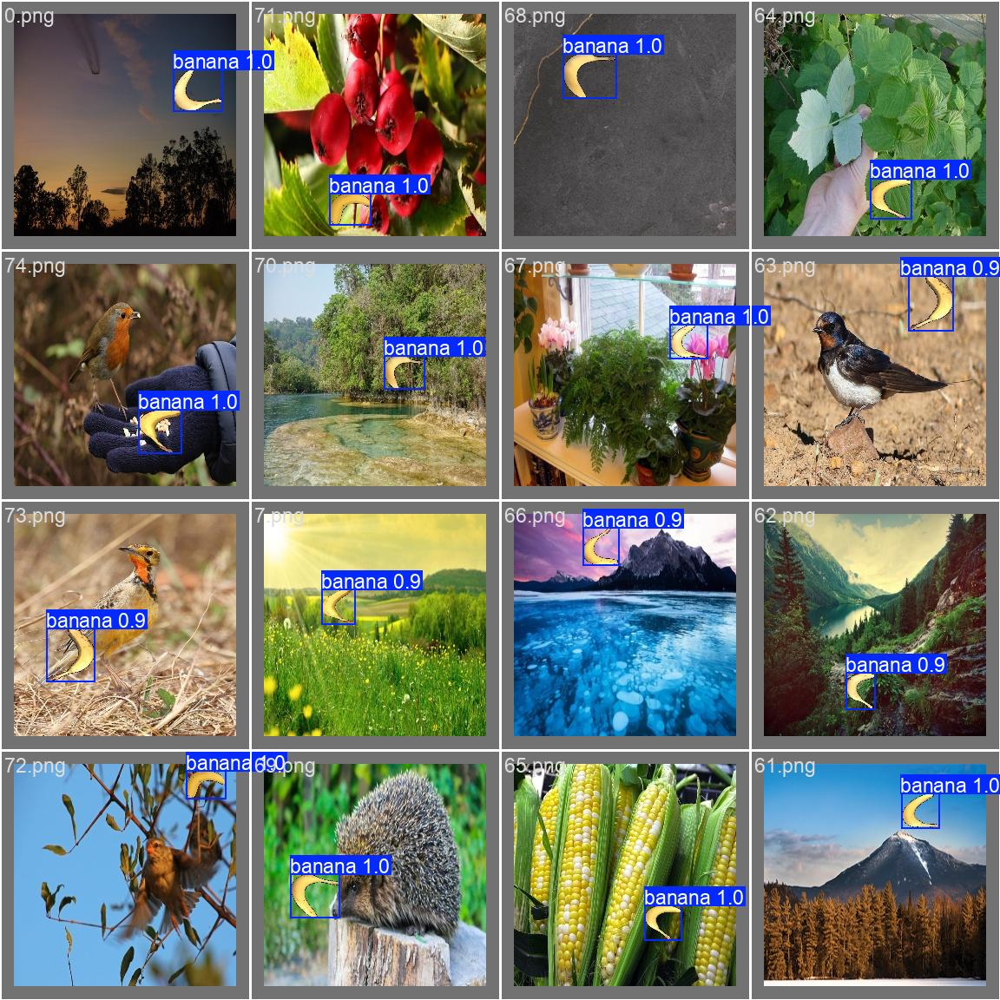

In [ ]:
Image(filename="/content/runs/detect/yolov8n_bananas/val_batch0_pred.jpg", width=600)

In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/yolov8n_bananas/weights/best.pt data=/content/bananas.yaml

Ultralytics YOLOv8.2.103 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/drive/MyDrive/banana-detection/bananas_val/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100% 100/100 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 7/7 [00:08<00:00,  1.17s/it]
                   all        100        100      0.999          1      0.995      0.982
Speed: 1.3ms preprocess, 60.0ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


Explain in your words how Yolo works.  You should utilize ChatGPT or equivalent to help you write the summary.

YOLO works by first breaking down each image into a N x N grid of patches. Each patch within the image is responsible for detecting if the center of an object  lies within itself. Each patch will predict a bounding box that details where the center of a object lies (relative to the patch) an how wide and high the bounding box should be (relative to the entire image). Each patch then predicts the class of the object lying within each bounding box, with the final probability being the confidence of the bounding box times the class probability of the object lying within the box.

Finally, to prevent overlapping bounding boxes on the same object, YOLO performs non-maximum suppression on the overlapping bounding boxes, keeping only the bounding boxes with the highest confidence level. To do this, it calculates IoU (Itersection over Union) to see which boxes overlap the most, and then discards the ones that intersect too much with the highest confidence level bounding boxes.


## 2.2. Using CV2

In the second part of the lab, you will use OpenCV to detect the position of a banana on a video stream.

In [ ]:
!pip install opencv-python

In [ ]:
# train on colab the Yolo network on bigger machine
# save weights and any other configuration parameters


0: 256x160 (no detections), 22.5ms
Speed: 0.9ms preprocess, 22.5ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 27.3ms
Speed: 1.8ms preprocess, 27.3ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 25.7ms
Speed: 0.9ms preprocess, 25.7ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 24.1ms
Speed: 1.7ms preprocess, 24.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 24.9ms
Speed: 0.9ms preprocess, 24.9ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 25.3ms
Speed: 1.0ms preprocess, 25.3ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 30.4ms
Speed: 1.0ms preprocess, 30.4ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 28.0ms
Speed: 0.8ms preprocess, 28.0ms i

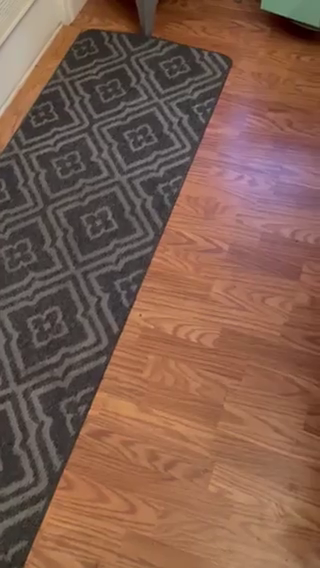


0: 256x160 (no detections), 28.5ms
Speed: 0.8ms preprocess, 28.5ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 27.8ms
Speed: 0.9ms preprocess, 27.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 25.4ms
Speed: 0.7ms preprocess, 25.4ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 27.2ms
Speed: 0.9ms preprocess, 27.2ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 26.6ms
Speed: 0.7ms preprocess, 26.6ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 35.1ms
Speed: 2.4ms preprocess, 35.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 24.1ms
Speed: 0.7ms preprocess, 24.1ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 24.7ms
Speed: 0.8ms preprocess, 24.7ms i

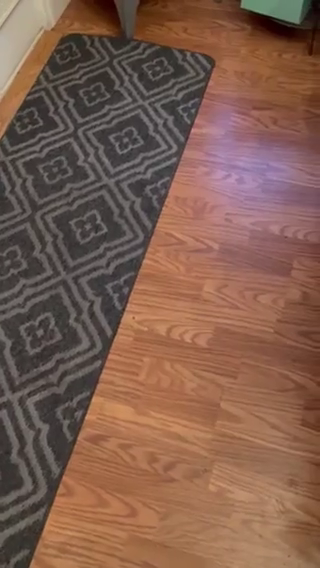


0: 256x160 (no detections), 25.7ms
Speed: 0.7ms preprocess, 25.7ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 25.8ms
Speed: 0.9ms preprocess, 25.8ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 28.9ms
Speed: 0.9ms preprocess, 28.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 26.8ms
Speed: 0.9ms preprocess, 26.8ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 26.6ms
Speed: 0.9ms preprocess, 26.6ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 26.6ms
Speed: 0.9ms preprocess, 26.6ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 30.4ms
Speed: 1.1ms preprocess, 30.4ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 27.3ms
Speed: 0.8ms preprocess, 27.3ms i

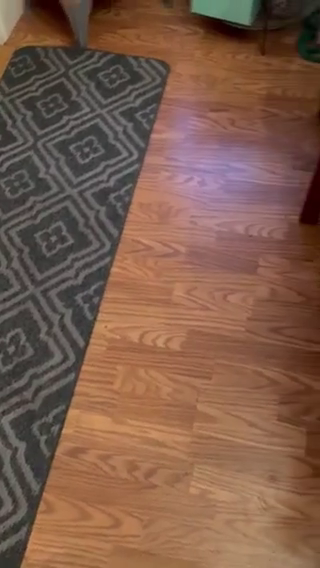


0: 256x160 (no detections), 25.9ms
Speed: 0.7ms preprocess, 25.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 26.3ms
Speed: 0.9ms preprocess, 26.3ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 29.1ms
Speed: 0.9ms preprocess, 29.1ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 28.4ms
Speed: 0.8ms preprocess, 28.4ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 35.2ms
Speed: 1.8ms preprocess, 35.2ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 31.7ms
Speed: 0.8ms preprocess, 31.7ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 27.0ms
Speed: 1.0ms preprocess, 27.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 28.5ms
Speed: 1.3ms preprocess, 28.5ms i

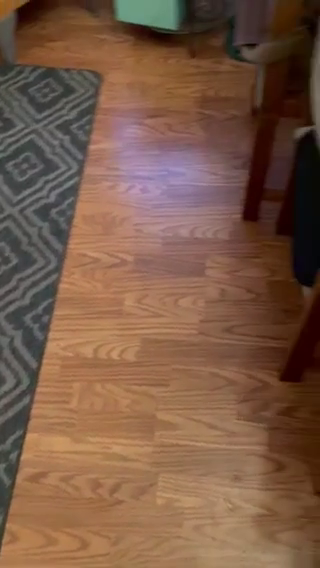


0: 256x160 (no detections), 30.8ms
Speed: 0.7ms preprocess, 30.8ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 28.6ms
Speed: 0.8ms preprocess, 28.6ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 27.1ms
Speed: 1.3ms preprocess, 27.1ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 29.2ms
Speed: 0.8ms preprocess, 29.2ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 28.2ms
Speed: 0.8ms preprocess, 28.2ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 27.8ms
Speed: 0.8ms preprocess, 27.8ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 29.3ms
Speed: 0.8ms preprocess, 29.3ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 27.7ms
Speed: 0.8ms preprocess, 27.7ms i

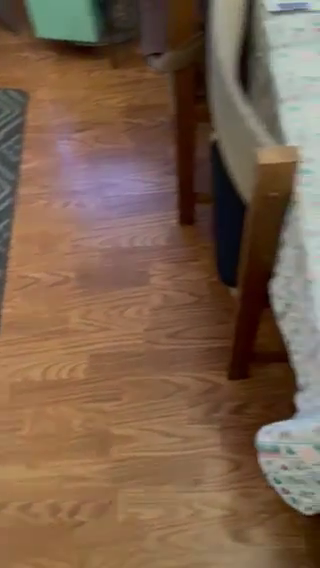


0: 256x160 (no detections), 34.3ms
Speed: 1.5ms preprocess, 34.3ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 28.7ms
Speed: 0.9ms preprocess, 28.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 29.7ms
Speed: 0.8ms preprocess, 29.7ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 27.9ms
Speed: 0.8ms preprocess, 27.9ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 27.4ms
Speed: 0.7ms preprocess, 27.4ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 27.5ms
Speed: 0.7ms preprocess, 27.5ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 27.8ms
Speed: 0.7ms preprocess, 27.8ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 27.6ms
Speed: 1.2ms preprocess, 27.6ms i

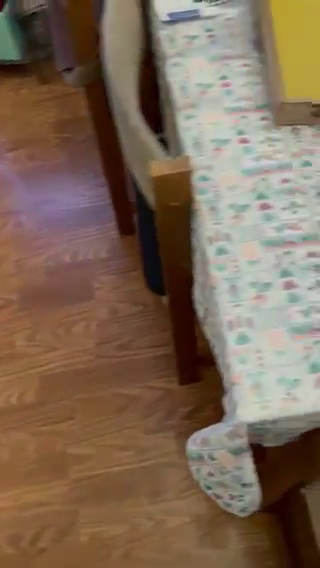


0: 256x160 1 banana, 53.1ms
Speed: 0.8ms preprocess, 53.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 29.5ms
Speed: 0.9ms preprocess, 29.5ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 28.2ms
Speed: 0.7ms preprocess, 28.2ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 28.7ms
Speed: 0.7ms preprocess, 28.7ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 144.0ms
Speed: 0.8ms preprocess, 144.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 119.3ms
Speed: 0.8ms preprocess, 119.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 70.7ms
Speed: 0.9ms preprocess, 70.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 31.0ms
Speed: 0.9ms preprocess, 31.0ms infe

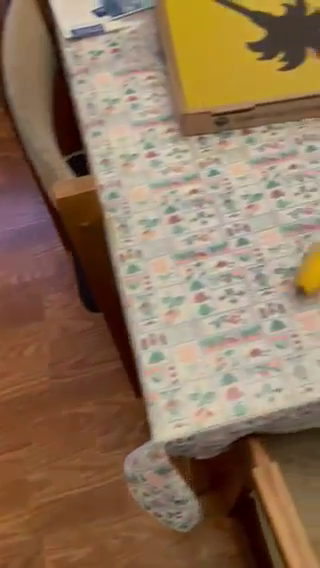


0: 256x160 (no detections), 30.8ms
Speed: 0.7ms preprocess, 30.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 33.5ms
Speed: 0.8ms preprocess, 33.5ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 31.3ms
Speed: 0.9ms preprocess, 31.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 34.7ms
Speed: 0.9ms preprocess, 34.7ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.6ms
Speed: 0.7ms preprocess, 29.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.5ms
Speed: 0.8ms preprocess, 30.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 30.1ms
Speed: 0.8ms preprocess, 30.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 (no detections), 30.3ms
Speed: 0.7ms preprocess, 30.3ms inference, 0.3m

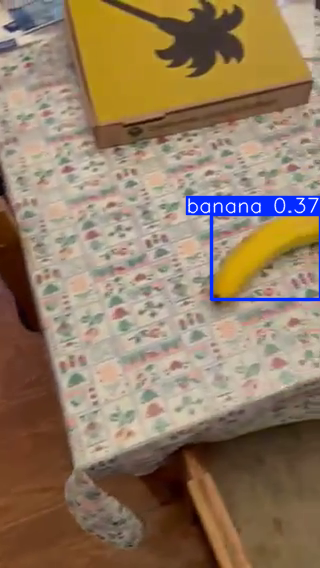


0: 256x160 2 bananas, 29.7ms
Speed: 0.7ms preprocess, 29.7ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.8ms
Speed: 0.9ms preprocess, 31.8ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.9ms
Speed: 0.7ms preprocess, 32.9ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.8ms
Speed: 0.7ms preprocess, 30.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.4ms
Speed: 0.7ms preprocess, 29.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.2ms
Speed: 0.8ms preprocess, 32.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.9ms
Speed: 1.8ms preprocess, 30.9ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 32.5ms
Speed: 0.9ms preprocess, 32.5ms inference, 0.7ms postprocess per image at shape (1, 3, 

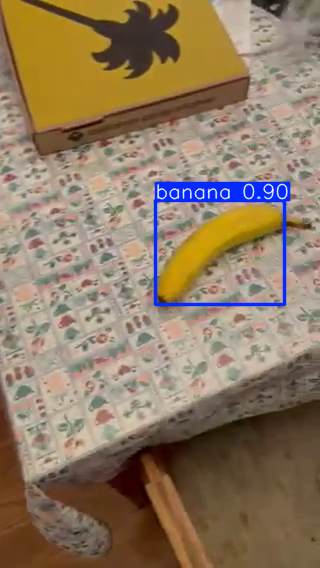


0: 256x160 1 banana, 30.2ms
Speed: 0.8ms preprocess, 30.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 29.0ms
Speed: 0.7ms preprocess, 29.0ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 43.2ms
Speed: 0.8ms preprocess, 43.2ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.0ms
Speed: 0.7ms preprocess, 31.0ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 39.8ms
Speed: 0.7ms preprocess, 39.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.3ms
Speed: 0.7ms preprocess, 30.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 32.1ms
Speed: 0.8ms preprocess, 32.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.3ms
Speed: 0.8ms preprocess, 30.3ms inference, 0.7ms postprocess per image at shape (1, 3, 

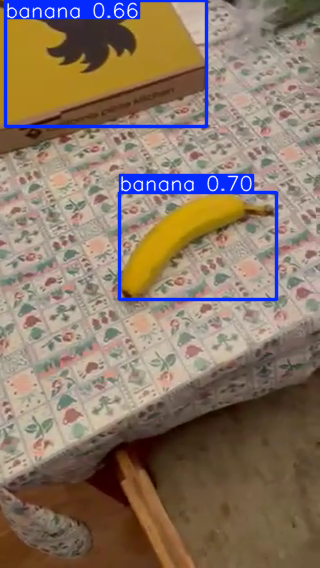


0: 256x160 2 bananas, 32.8ms
Speed: 0.8ms preprocess, 32.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 29.3ms
Speed: 1.4ms preprocess, 29.3ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 31.3ms
Speed: 0.9ms preprocess, 31.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 35.6ms
Speed: 0.8ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 31.8ms
Speed: 0.7ms preprocess, 31.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 33.2ms
Speed: 1.0ms preprocess, 33.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 33.5ms
Speed: 0.8ms preprocess, 33.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.9ms
Speed: 0.7ms preprocess, 29.9ms inference, 0.7ms postprocess per image at shape (1, 

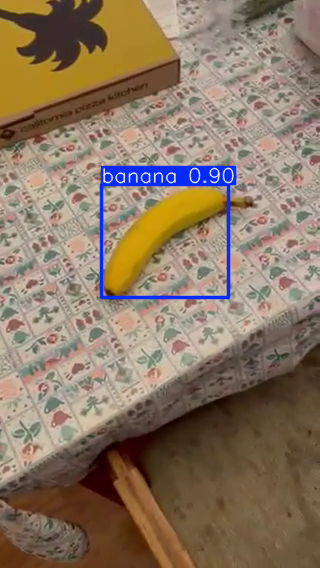


0: 256x160 2 bananas, 33.8ms
Speed: 0.7ms preprocess, 33.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 31.9ms
Speed: 2.2ms preprocess, 31.9ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 33.3ms
Speed: 0.8ms preprocess, 33.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 30.7ms
Speed: 0.8ms preprocess, 30.7ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 30.8ms
Speed: 0.9ms preprocess, 30.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 32.2ms
Speed: 0.9ms preprocess, 32.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 33.9ms
Speed: 2.9ms preprocess, 33.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 38.4ms
Speed: 0.8ms preprocess, 38.4ms inference, 0.7ms postprocess per image at shape (

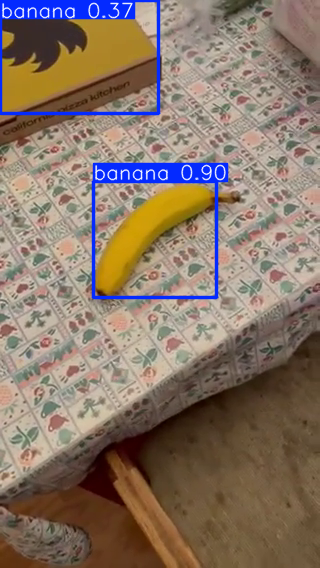


0: 256x160 1 banana, 31.1ms
Speed: 0.7ms preprocess, 31.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.9ms
Speed: 0.8ms preprocess, 29.9ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.2ms
Speed: 0.9ms preprocess, 31.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.4ms
Speed: 0.7ms preprocess, 29.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.4ms
Speed: 0.7ms preprocess, 29.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 32.4ms
Speed: 0.8ms preprocess, 32.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 33.7ms
Speed: 0.8ms preprocess, 33.7ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 45.5ms
Speed: 0.8ms preprocess, 45.5ms inference, 0.7ms postprocess per image at shape (1, 3,

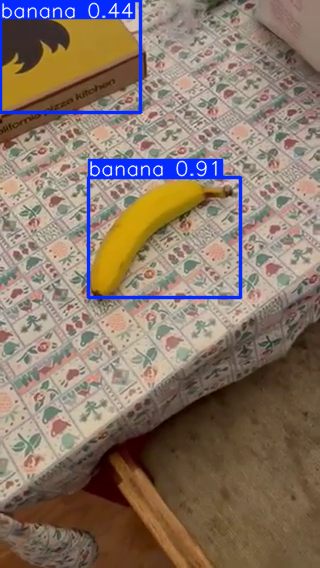


0: 256x160 2 bananas, 33.1ms
Speed: 1.8ms preprocess, 33.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 45.2ms
Speed: 0.8ms preprocess, 45.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 47.9ms
Speed: 3.9ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 43.2ms
Speed: 0.8ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 37.0ms
Speed: 0.7ms preprocess, 37.0ms inference, 4.9ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 32.9ms
Speed: 0.7ms preprocess, 32.9ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 33.3ms
Speed: 0.7ms preprocess, 33.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 39.0ms
Speed: 0.8ms preprocess, 39.0ms inference, 1.0ms postprocess per image at shape (1, 3,

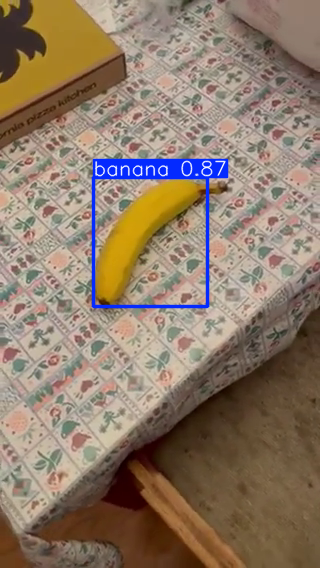


0: 256x160 1 banana, 43.0ms
Speed: 0.7ms preprocess, 43.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 47.7ms
Speed: 0.7ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 34.6ms
Speed: 0.8ms preprocess, 34.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 41.3ms
Speed: 1.7ms preprocess, 41.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 32.5ms
Speed: 2.6ms preprocess, 32.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.5ms
Speed: 1.7ms preprocess, 32.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.5ms
Speed: 2.0ms preprocess, 29.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.9ms
Speed: 0.8ms preprocess, 29.9ms inference, 0.7ms postprocess per image at shape (1, 3, 2

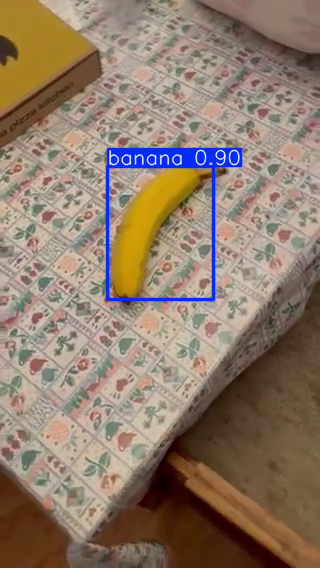


0: 256x160 1 banana, 31.4ms
Speed: 0.7ms preprocess, 31.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.5ms
Speed: 0.8ms preprocess, 32.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.4ms
Speed: 0.9ms preprocess, 31.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.9ms
Speed: 0.8ms preprocess, 31.9ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 34.0ms
Speed: 0.9ms preprocess, 34.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.0ms
Speed: 0.8ms preprocess, 31.0ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 34.0ms
Speed: 0.8ms preprocess, 34.0ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 33.6ms
Speed: 0.8ms preprocess, 33.6ms inference, 0.7ms postprocess per image at shape (1, 3, 25

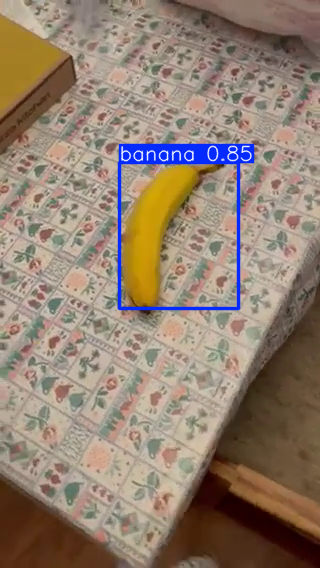


0: 256x160 1 banana, 30.6ms
Speed: 0.9ms preprocess, 30.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.4ms
Speed: 0.8ms preprocess, 32.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.9ms
Speed: 0.8ms preprocess, 29.9ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 35.8ms
Speed: 1.7ms preprocess, 35.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.2ms
Speed: 0.8ms preprocess, 31.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.6ms
Speed: 0.8ms preprocess, 31.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.5ms
Speed: 0.7ms preprocess, 30.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 37.3ms
Speed: 0.7ms preprocess, 37.3ms inference, 0.8ms postprocess per image at shape (1, 3, 25

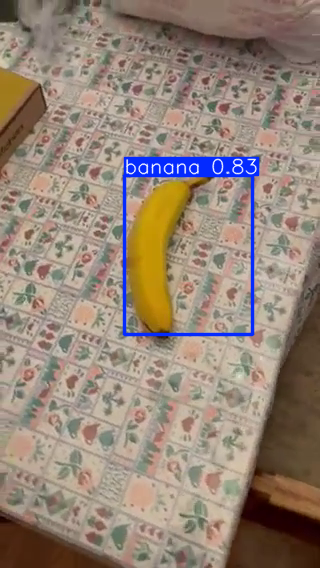


0: 256x160 1 banana, 33.9ms
Speed: 1.7ms preprocess, 33.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.1ms
Speed: 0.8ms preprocess, 31.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.2ms
Speed: 0.7ms preprocess, 29.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 29.7ms
Speed: 0.8ms preprocess, 29.7ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 29.9ms
Speed: 0.7ms preprocess, 29.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 31.5ms
Speed: 0.7ms preprocess, 31.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.3ms
Speed: 0.8ms preprocess, 31.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.4ms
Speed: 0.8ms preprocess, 30.4ms inference, 0.7ms postprocess per image at shape (1, 3,

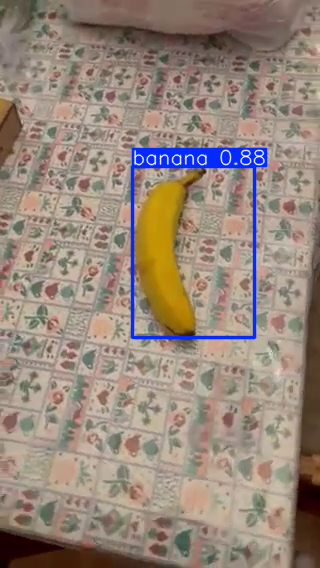


0: 256x160 1 banana, 29.2ms
Speed: 0.7ms preprocess, 29.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.8ms
Speed: 0.8ms preprocess, 32.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.1ms
Speed: 0.7ms preprocess, 30.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 34.2ms
Speed: 0.9ms preprocess, 34.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.7ms
Speed: 0.8ms preprocess, 32.7ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.2ms
Speed: 0.8ms preprocess, 32.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.4ms
Speed: 0.8ms preprocess, 29.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 34.5ms
Speed: 0.7ms preprocess, 34.5ms inference, 0.7ms postprocess per image at shape (1, 3, 25

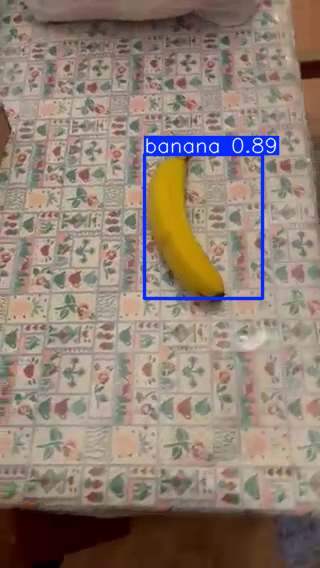


0: 256x160 1 banana, 29.5ms
Speed: 0.7ms preprocess, 29.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 35.8ms
Speed: 0.7ms preprocess, 35.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.4ms
Speed: 1.6ms preprocess, 29.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.3ms
Speed: 0.7ms preprocess, 32.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.1ms
Speed: 0.8ms preprocess, 30.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.8ms
Speed: 1.6ms preprocess, 29.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.8ms
Speed: 1.1ms preprocess, 31.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.0ms
Speed: 0.7ms preprocess, 31.0ms inference, 0.7ms postprocess per image at shape (1, 3, 25

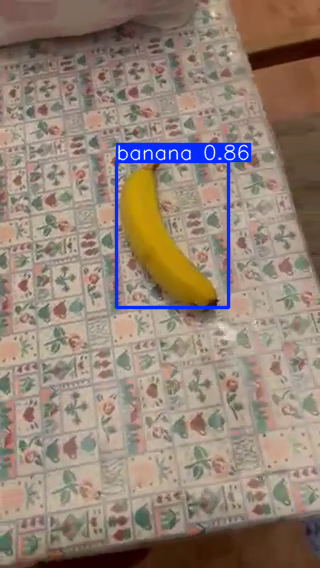


0: 256x160 1 banana, 44.6ms
Speed: 0.9ms preprocess, 44.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 38.7ms
Speed: 0.9ms preprocess, 38.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 34.1ms
Speed: 0.7ms preprocess, 34.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.4ms
Speed: 0.7ms preprocess, 31.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 41.7ms
Speed: 0.8ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 42.1ms
Speed: 0.7ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 36.4ms
Speed: 2.0ms preprocess, 36.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.7ms
Speed: 0.8ms preprocess, 31.7ms inference, 0.7ms postprocess per image at shape (1, 3, 25

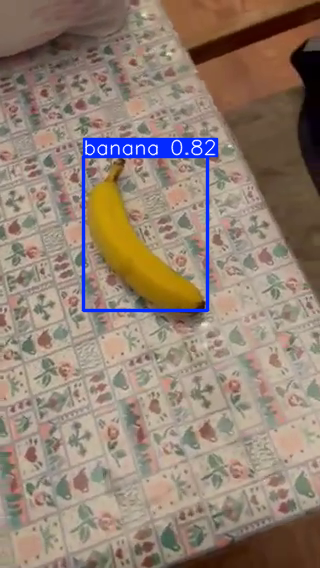


0: 256x160 1 banana, 31.3ms
Speed: 1.5ms preprocess, 31.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.1ms
Speed: 1.6ms preprocess, 30.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.7ms
Speed: 0.7ms preprocess, 30.7ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 36.3ms
Speed: 2.8ms preprocess, 36.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 41.5ms
Speed: 0.8ms preprocess, 41.5ms inference, 3.1ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 37.7ms
Speed: 0.8ms preprocess, 37.7ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 43.2ms
Speed: 0.8ms preprocess, 43.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 49.9ms
Speed: 0.8ms preprocess, 49.9ms inference, 0.9ms postprocess per image at shape (1, 3, 25

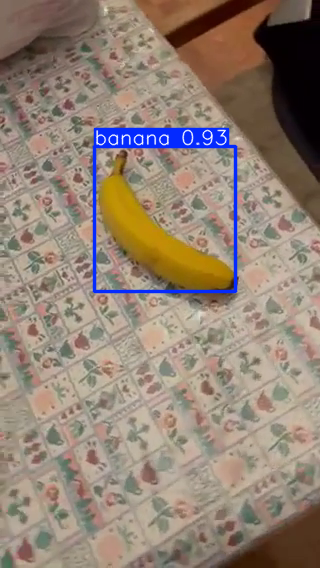


0: 256x160 1 banana, 30.1ms
Speed: 0.8ms preprocess, 30.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.1ms
Speed: 0.7ms preprocess, 31.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 28.7ms
Speed: 1.0ms preprocess, 28.7ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 33.1ms
Speed: 0.8ms preprocess, 33.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.3ms
Speed: 0.8ms preprocess, 30.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.9ms
Speed: 0.8ms preprocess, 29.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 33.0ms
Speed: 0.7ms preprocess, 33.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.8ms
Speed: 0.8ms preprocess, 29.8ms inference, 0.7ms postprocess per image at shape (1, 3, 25

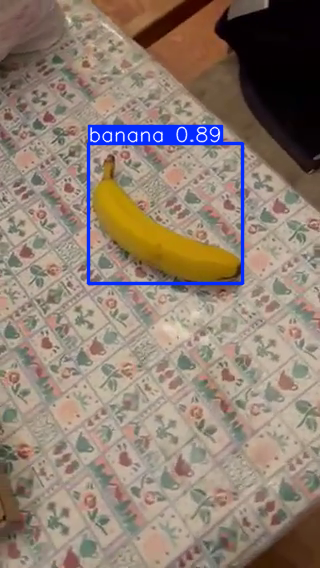


0: 256x160 1 banana, 30.0ms
Speed: 0.8ms preprocess, 30.0ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.2ms
Speed: 0.7ms preprocess, 29.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.6ms
Speed: 0.7ms preprocess, 32.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.2ms
Speed: 0.7ms preprocess, 31.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.3ms
Speed: 0.7ms preprocess, 31.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.3ms
Speed: 0.7ms preprocess, 29.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.5ms
Speed: 0.9ms preprocess, 31.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.2ms
Speed: 0.7ms preprocess, 30.2ms inference, 0.7ms postprocess per image at shape (1, 3, 25

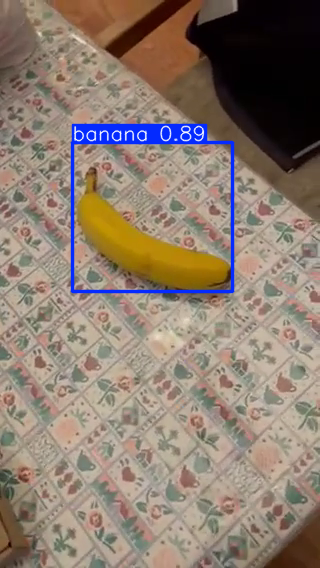


0: 256x160 1 banana, 33.2ms
Speed: 0.8ms preprocess, 33.2ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.4ms
Speed: 0.8ms preprocess, 29.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.7ms
Speed: 0.8ms preprocess, 29.7ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.9ms
Speed: 0.8ms preprocess, 31.9ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 33.6ms
Speed: 0.8ms preprocess, 33.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.1ms
Speed: 1.0ms preprocess, 31.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.2ms
Speed: 0.8ms preprocess, 30.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 41.6ms
Speed: 0.9ms preprocess, 41.6ms inference, 0.8ms postprocess per image at shape (1, 3, 25

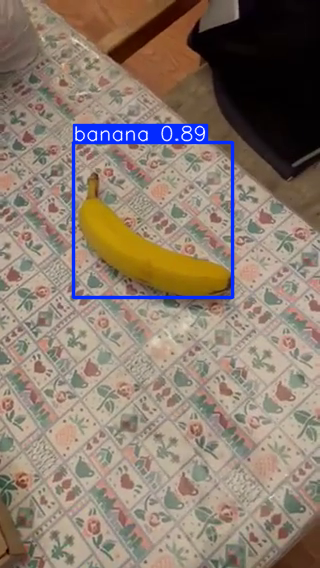


0: 256x160 1 banana, 29.8ms
Speed: 0.7ms preprocess, 29.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.2ms
Speed: 0.8ms preprocess, 30.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.3ms
Speed: 0.9ms preprocess, 32.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 34.8ms
Speed: 1.6ms preprocess, 34.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.2ms
Speed: 0.8ms preprocess, 31.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.1ms
Speed: 0.9ms preprocess, 30.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.3ms
Speed: 0.8ms preprocess, 30.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.6ms
Speed: 0.8ms preprocess, 32.6ms inference, 0.7ms postprocess per image at shape (1, 3, 25

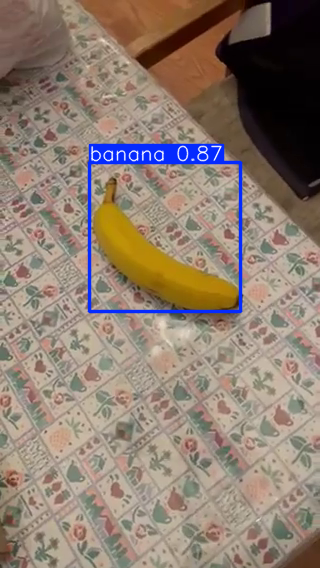


0: 256x160 1 banana, 31.6ms
Speed: 0.7ms preprocess, 31.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.3ms
Speed: 0.8ms preprocess, 32.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.1ms
Speed: 0.7ms preprocess, 30.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.3ms
Speed: 0.8ms preprocess, 30.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.5ms
Speed: 0.8ms preprocess, 29.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.1ms
Speed: 1.0ms preprocess, 32.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.6ms
Speed: 0.7ms preprocess, 29.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 33.4ms
Speed: 0.7ms preprocess, 33.4ms inference, 0.7ms postprocess per image at shape (1, 3, 25

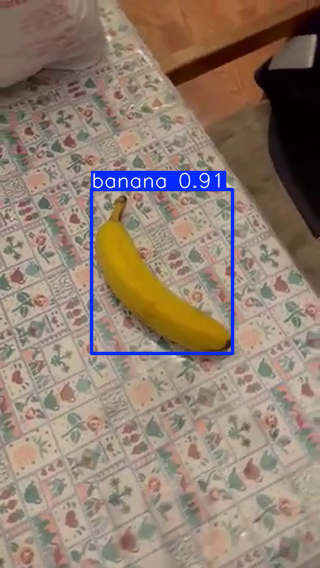


0: 256x160 1 banana, 31.0ms
Speed: 0.9ms preprocess, 31.0ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.0ms
Speed: 0.8ms preprocess, 29.0ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.8ms
Speed: 0.8ms preprocess, 29.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.6ms
Speed: 0.7ms preprocess, 30.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.5ms
Speed: 0.9ms preprocess, 31.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.2ms
Speed: 0.7ms preprocess, 29.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.2ms
Speed: 0.7ms preprocess, 29.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.4ms
Speed: 0.7ms preprocess, 31.4ms inference, 0.7ms postprocess per image at shape (1, 3, 25

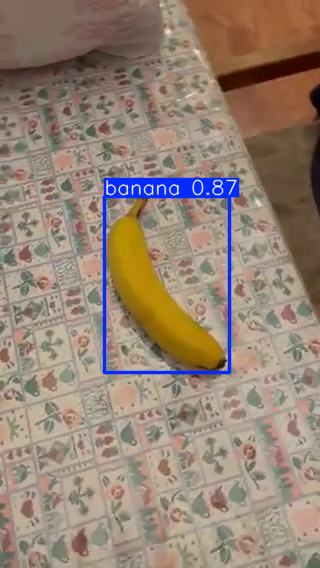


0: 256x160 1 banana, 40.7ms
Speed: 0.8ms preprocess, 40.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.7ms
Speed: 0.8ms preprocess, 31.7ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.7ms
Speed: 0.8ms preprocess, 32.7ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 42.2ms
Speed: 0.8ms preprocess, 42.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 42.1ms
Speed: 0.9ms preprocess, 42.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 39.8ms
Speed: 0.8ms preprocess, 39.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 33.4ms
Speed: 0.8ms preprocess, 33.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 33.0ms
Speed: 0.8ms preprocess, 33.0ms inference, 0.7ms postprocess per image at shape (1, 3, 25

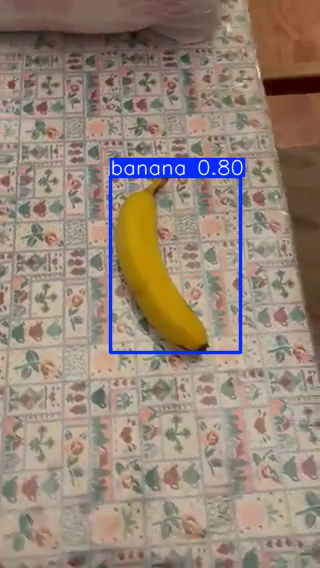


0: 256x160 1 banana, 33.3ms
Speed: 0.8ms preprocess, 33.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 33.0ms
Speed: 0.7ms preprocess, 33.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 40.0ms
Speed: 3.1ms preprocess, 40.0ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 37.7ms
Speed: 0.8ms preprocess, 37.7ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.8ms
Speed: 0.8ms preprocess, 29.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 39.4ms
Speed: 0.9ms preprocess, 39.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 39.7ms
Speed: 0.7ms preprocess, 39.7ms inference, 2.9ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 35.9ms
Speed: 0.7ms preprocess, 35.9ms inference, 0.7ms postprocess per image at shape (1, 3, 25

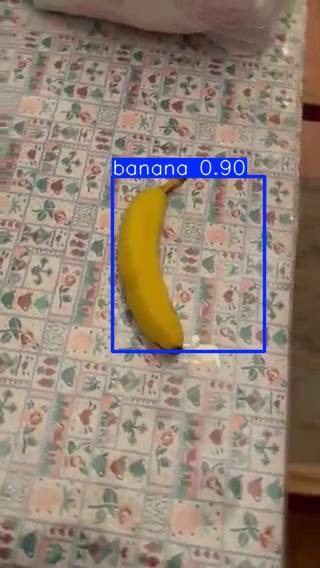


0: 256x160 1 banana, 30.5ms
Speed: 0.7ms preprocess, 30.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 33.7ms
Speed: 0.7ms preprocess, 33.7ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 37.0ms
Speed: 0.8ms preprocess, 37.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 33.9ms
Speed: 0.8ms preprocess, 33.9ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.7ms
Speed: 0.9ms preprocess, 30.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.7ms
Speed: 0.7ms preprocess, 29.7ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.4ms
Speed: 0.7ms preprocess, 29.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.5ms
Speed: 0.7ms preprocess, 30.5ms inference, 0.9ms postprocess per image at shape (1, 3, 25

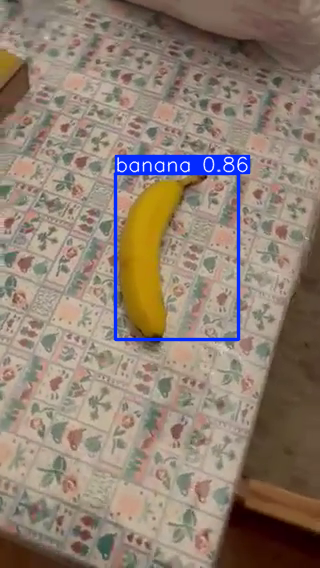


0: 256x160 1 banana, 30.1ms
Speed: 0.8ms preprocess, 30.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.3ms
Speed: 0.8ms preprocess, 29.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.2ms
Speed: 0.7ms preprocess, 30.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.0ms
Speed: 0.8ms preprocess, 30.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.9ms
Speed: 0.8ms preprocess, 31.9ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 36.8ms
Speed: 0.8ms preprocess, 36.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 32.2ms
Speed: 0.7ms preprocess, 32.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.4ms
Speed: 0.7ms preprocess, 29.4ms inference, 0.7ms postprocess per image at shape (1, 3, 25

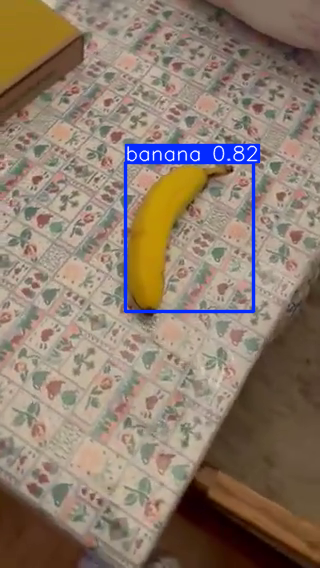


0: 256x160 1 banana, 32.9ms
Speed: 0.9ms preprocess, 32.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 29.3ms
Speed: 0.7ms preprocess, 29.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 44.6ms
Speed: 0.8ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.2ms
Speed: 0.7ms preprocess, 30.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.9ms
Speed: 0.8ms preprocess, 30.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 38.4ms
Speed: 0.8ms preprocess, 38.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 33.0ms
Speed: 0.9ms preprocess, 33.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.2ms
Speed: 0.9ms preprocess, 31.2ms inference, 0.7ms postprocess per image at shape (1, 3, 25

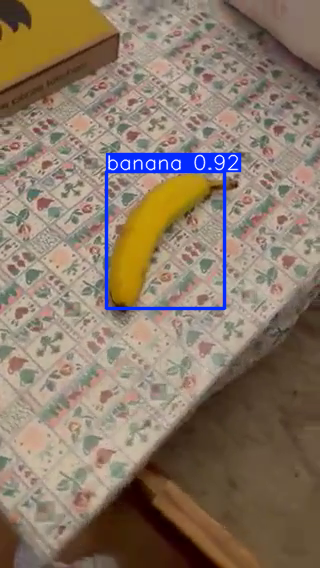


0: 256x160 1 banana, 33.5ms
Speed: 1.7ms preprocess, 33.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 36.5ms
Speed: 2.1ms preprocess, 36.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.8ms
Speed: 1.6ms preprocess, 30.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 30.5ms
Speed: 0.7ms preprocess, 30.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 30.4ms
Speed: 0.8ms preprocess, 30.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 33.2ms
Speed: 1.7ms preprocess, 33.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 29.4ms
Speed: 0.7ms preprocess, 29.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 32.9ms
Speed: 0.8ms preprocess, 32.9ms inference, 0.8ms postprocess per image at shape (1, 3

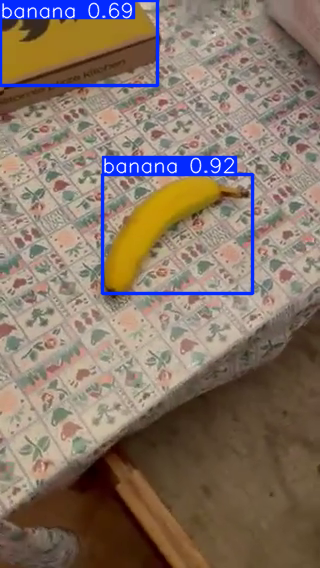


0: 256x160 2 bananas, 30.2ms
Speed: 2.1ms preprocess, 30.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 30.0ms
Speed: 1.7ms preprocess, 30.0ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 32.9ms
Speed: 2.0ms preprocess, 32.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 31.5ms
Speed: 0.8ms preprocess, 31.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 30.6ms
Speed: 0.8ms preprocess, 30.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 29.0ms
Speed: 0.7ms preprocess, 29.0ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 29.5ms
Speed: 0.8ms preprocess, 29.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 31.9ms
Speed: 2.0ms preprocess, 31.9ms inference, 0.7ms postprocess per image at shape (

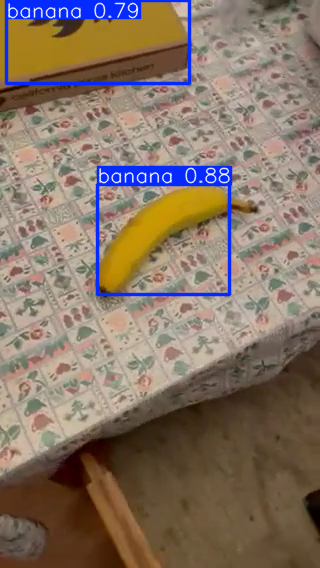


0: 256x160 2 bananas, 31.2ms
Speed: 0.7ms preprocess, 31.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 3 bananas, 29.8ms
Speed: 1.6ms preprocess, 29.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 3 bananas, 30.4ms
Speed: 2.5ms preprocess, 30.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 3 bananas, 31.3ms
Speed: 2.4ms preprocess, 31.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 29.3ms
Speed: 1.5ms preprocess, 29.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 3 bananas, 30.1ms
Speed: 1.8ms preprocess, 30.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 30.9ms
Speed: 0.7ms preprocess, 30.9ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 36.6ms
Speed: 0.8ms preprocess, 36.6ms inference, 0.8ms postprocess per image at shape (

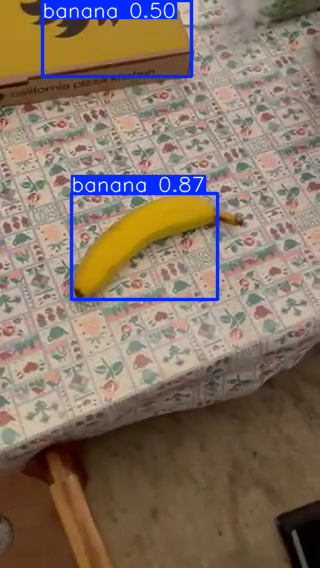


0: 256x160 2 bananas, 40.6ms
Speed: 0.8ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 34.8ms
Speed: 0.7ms preprocess, 34.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 35.5ms
Speed: 0.8ms preprocess, 35.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 2 bananas, 42.2ms
Speed: 0.8ms preprocess, 42.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 38.6ms
Speed: 0.9ms preprocess, 38.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 40.4ms
Speed: 0.8ms preprocess, 40.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 45.1ms
Speed: 0.8ms preprocess, 45.1ms inference, 4.0ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 47.1ms
Speed: 0.7ms preprocess, 47.1ms inference, 1.0ms postprocess per image at shape (1, 3

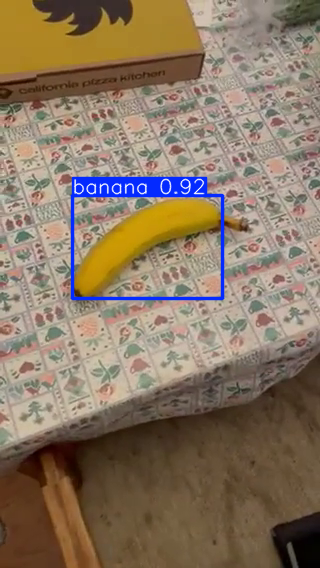


0: 256x160 1 banana, 40.1ms
Speed: 0.8ms preprocess, 40.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 160)

0: 256x160 1 banana, 31.4ms
Speed: 1.8ms preprocess, 31.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 160)
Stopped video
... waiting for any key to be pressed
... done


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

vc = cv2.VideoCapture("/content/IMG_4730.mp4")

frame_num = 0
while True:
    ret, frame = vc.read()
    if not ret:
        print('Stopped video')
        break
    frame_num += 1
    h, w, _ = frame.shape
    img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (256, 256))

    img_to_deep_learning = img

    img_mean = np.array([127, 127, 127])
    img = (img - img_mean) / 128

    #img = np.transpose(img, [2, 0, 1])
    img = np.expand_dims(img, axis=0)
    img = img.astype(np.float32)

    # Add your code here to add YOLO
    model = YOLO("/content/best.pt")

    results = model(frame)

    img[0, 50:150, 120:130] = 1.0

    if frame_num % 10 == 0:
        for result in results:
          cv2_imshow(result.plot())

    if cv2.waitKey(1) & 0xFF == ord('q'):
        print('Keyboard typed')
        break

vc.release()
cv2.destroyAllWindows()
print('... waiting for any key to be pressed')
cv2.waitKey(0)
print('... done')

As part of the submission results, you will submit a video of banana detection.

# 3. Word2Vec

Let's first download a word2vec dictionary with a vector dimension 300 for each word from Google News.

In [ ]:
!pip install gensim
!pip install umap-learn

In [ ]:
import gensim.downloader as api

wv = api.load('word2vec-google-news-300')

[==================================================] 100.0% 1662.8/1662.8MB downloaded


In [ ]:
king = wv["king"]

king.shape

(300,)

In [ ]:
king

array([ 1.25976562e-01,  2.97851562e-02,  8.60595703e-03,  1.39648438e-01,
       -2.56347656e-02, -3.61328125e-02,  1.11816406e-01, -1.98242188e-01,
        5.12695312e-02,  3.63281250e-01, -2.42187500e-01, -3.02734375e-01,
       -1.77734375e-01, -2.49023438e-02, -1.67968750e-01, -1.69921875e-01,
        3.46679688e-02,  5.21850586e-03,  4.63867188e-02,  1.28906250e-01,
        1.36718750e-01,  1.12792969e-01,  5.95703125e-02,  1.36718750e-01,
        1.01074219e-01, -1.76757812e-01, -2.51953125e-01,  5.98144531e-02,
        3.41796875e-01, -3.11279297e-02,  1.04492188e-01,  6.17675781e-02,
        1.24511719e-01,  4.00390625e-01, -3.22265625e-01,  8.39843750e-02,
        3.90625000e-02,  5.85937500e-03,  7.03125000e-02,  1.72851562e-01,
        1.38671875e-01, -2.31445312e-01,  2.83203125e-01,  1.42578125e-01,
        3.41796875e-01, -2.39257812e-02, -1.09863281e-01,  3.32031250e-02,
       -5.46875000e-02,  1.53198242e-02, -1.62109375e-01,  1.58203125e-01,
       -2.59765625e-01,  

Because each word is represented as a vector in the space $\cal{R}^{300}$, we can compute similarity between words.

In [ ]:
print(wv.most_similar(positive=["king", "queen", 'royal'], topn=10))

[('monarch', 0.7630465626716614), ('prince', 0.7122635841369629), ('princess', 0.6952192783355713), ('royals', 0.691109836101532), ('princes', 0.6675854325294495), ('kings', 0.6575640439987183), ('queens', 0.6341844797134399), ('crown_prince', 0.6330040693283081), ('Queen_Consort', 0.6233131289482117), ('NYC_anglophiles_aflutter', 0.6210921406745911)]


In this case, you can simply compute the cosine distance between two words.

In [ ]:
print(wv.similarity("suv", "car" ))

0.60543627


And you can compute words that match vector operations such as $\tt{vec(king)} - \tt{vec(man)} + \tt{vec(woman)} = ?$

In [ ]:
print(wv.most_similar(positive=["king", "queen"], negative=["man"]))

[('queens', 0.595018744468689), ('monarch', 0.5815044641494751), ('kings', 0.5612992644309998), ('royal', 0.5204525589942932), ('princess', 0.5191516876220703), ('princes', 0.5086392164230347), ('NYC_anglophiles_aflutter', 0.5057314038276672), ('Queen_Consort', 0.49256712198257446), ('Queen', 0.4822567403316498), ('royals', 0.4781743586063385)]


Because every word is represented by a vector, at the end a ML model will only be able to represent vectors or differences in vectors as represented by the embedding. If the training set contains bias, the representation of the vectors will be as good as the training set.

In [ ]:
print(wv.most_similar(positive=["woman", "king"], negative=["man"]))

[('queen', 0.7118193507194519), ('monarch', 0.6189674139022827), ('princess', 0.5902431011199951), ('crown_prince', 0.5499460697174072), ('prince', 0.5377321839332581), ('kings', 0.5236844420433044), ('Queen_Consort', 0.5235945582389832), ('queens', 0.5181134343147278), ('sultan', 0.5098593831062317), ('monarchy', 0.5087411999702454)]


Let's see what's happening here by visualizing these 4 points.

In [ ]:
king = wv['king']
queen = wv['queen']
woman = wv['woman']
man = wv['man']

labels = ['king', 'queen', 'woman', 'man']
x = np.array([king, queen, woman, man])

results = umap.UMAP().fit_transform(x)

r = { label: results[i] for i, label in enumerate(labels) }
for label in r:
    print(label, r[label])

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


king [-7.949923 30.940207]
queen [-8.818913 31.459862]
woman [-9.22131  30.359028]
man [-8.347907 29.928694]


In [ ]:
np.dot(man,king) / (np.linalg.norm(king)*np.linalg.norm(man))

0.22942673

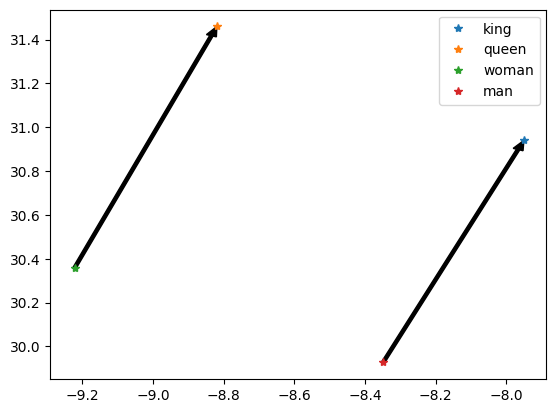

In [ ]:
for label in r:
    plt.plot(r[label][0], r[label][1], '*', label=label)
plt.arrow(
    r['man'][0], r['man'][1],
    r['king'][0]-r['man'][0], r['king'][1]-r['man'][1],
    color='black', length_includes_head=True, width=0.01)
plt.arrow(
    r['woman'][0], r['woman'][1],
    r['queen'][0]-r['woman'][0], r['queen'][1]-r['woman'][1],
    color='black', length_includes_head=True, width=0.01)
plt.legend()
plt.show()

Why is it important to remove bias from the embeddings?

Imagine in a situation where you are analyzing if you are going to give loan to a person based on the difference of two embeddings $\sum (v_1 - v_2)$, and suppose that the same difference appears in $\sum (v_3 - v_4)$.

For example, $v_1$ could be derived a sentence implying the person has good credit, and $v_2$ could be derived from a sentece where the person has no outstanding loans, whereas $v_3$ could represent a person's race, and $v_4$ could be derived from the person not paying the loan.

In our system, we will give a score based on the following result $v_1 - v_2 + v_3$ (very simple logistic classifier). The answer to the system could be a score that represents _the person will pay the loan_ or _the person will not pay the loan_. What will happen in this case?

Answer: Since the difference between having good credit (v1) and having no outstanding loans (v2) and the difference between a person's race (v3) and having bad credit (v4) is the same, it makes it so that not paying the loan has the same relational meaning to a person's race as to having no outstanding loans is to having good credit. This is bad, as it creates discriminatory scores based on someone's race.

# 4. Using Embeddings in Gradient Boosting

In this lab, you will use categorical embeddings to improve gradient boosting techniques (they are quite popular to win Kaggle competitions).

Suppose you have a table where one of the fields is day of the week (Monday = 0, Tuesday = 1, etc).

Several techniques exist to encode these variables, one-hot, using the average of the output label, etc.

Idea in this case is to use an auxiliary model with embeddings for the categorical variables, use the model to predict the output variable, and then transfer the values of the embeddings to the a new table, where you will run a gradient boosting algorithm.

Part of this lab can be found in the following page.

https://medium.com/towards-data-science/deep-embeddings-for-categorical-variables-cat2vec-b05c8ab63ac0

In [ ]:
!pip install xgboost

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [04:42:20] WARNING: /workspace/src/objective/regression_obj.cu:227: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)


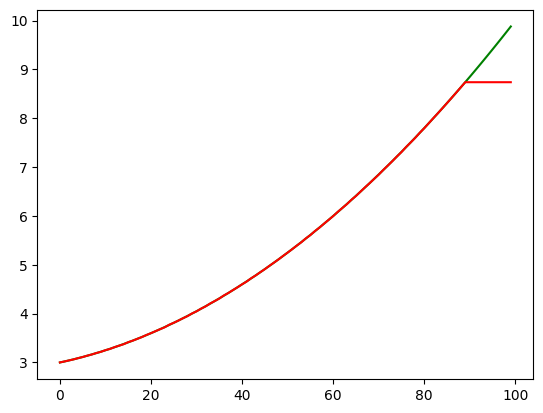

In [ ]:
import xgboost as xg

model = xg.XGBRegressor(objective="reg:linear", random_state=42)

# y = F(x)
# model = []
# for _ in range(n_trees):
#     tree = create_a_shallow_tree(x, y)
#     p = tree(x)
#     y = y - p <--- gradient of the MSE = (y - p)**2 -> gradient()

x = np.arange(100) / 100
y = 3 + 2*x + 5*x**2

model.fit(x[:90].reshape(-1,1), y[:90])
p = model.predict(x)

import matplotlib.pyplot as plt
plt.plot(y, color='green')
plt.plot(p, color='red')

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

df = pd.read_csv('bike_sharing_daily.csv')
df

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,727,2012-12-27,1,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,247,1867,2114
727,728,2012-12-28,1,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,3095
728,729,2012-12-29,1,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,1341
729,730,2012-12-30,1,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,364,1432,1796


In [ ]:
df.columns

Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

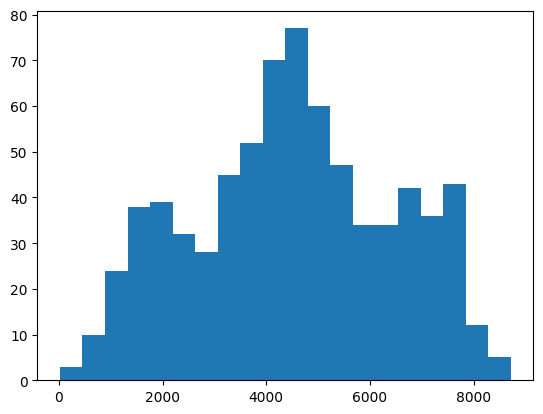

In [ ]:
plt.hist(df.cnt.values, bins=20)
plt.show()

You will answer the following questions. This is related to the paper Cat2Vec (found at https://openreview.net/forum?id=HyNxRZ9xg).

### 4.1. In this table, which variables are categorical?

In this table, there are 7 variables that are categorical:
season, yr, mnth, holiday, weekday, workingday, and weathersit.

### 4.2. How many embeddings do you need to create?

7 embeddings, one for each of the variables that are categorical.

### 4.3. What are the embeddings size?

Jeremy Howard suggested that the size of the embedding vector should be $\tt{embedding\_size} = \min(50, (m+1) / 2)$, where $m$ is the number of categories.

Thus, for each categorical variable:
- season: size of 2
- yr: size of 1
- mnth: size of 6
- holiday: size of 1
- weekday: size of 4
- workingday: size of 1
- weathersit: size of 2

### 4.4. Train embeddings model

Train a small model with a number of embeddings, concatenated, and one dense layer, trying to predict the variable `cnt`.

You can refer to the following paper too: https://arxiv.org/abs/2104.04781

```python
xl = []
for i in range(number_of_categorical_variables):
    x = Embedding(...)(input[i]) # (NI, NO)
    xl.append(x)
x = Concatente()(xl)
x = Dense(1)(x)
```

### 4.5. What are the sizes of the embedding matrices?

Each embedding matrix is of size (num_values, output_dim), where num_values is the nummber of possible values for each variable and output_dim is a number we specified to be $\min(50, (m+1) / 2)$, where $m$ is the number of categories.

### 4.6. Create a new table with the values and embedded values

### 4.7. What's Gradient Boosting?

Gradient Boosting is the idea of using several weaker models together instead of one very strong model to classify/regress data samples. It relies on the principle that creating several weak predictions that work to fix the errors of the previous prediction is easier than creating a single extremely accuate prediction.

### 4.8. Use Gradient Boosting (xgboost or catboost) to train the model with the new table

In [ ]:
# add variables you will choose to create embeddings for
df_emb_vars = [
    'season',
    'yr',
    'mnth',
    'holiday',
    'weekday',
    'workingday',
    'weathersit'
]

In [ ]:
x = xi = Input((len(df_emb_vars),))
xl = []
for i in range(len(df_emb_vars)):
    v_min = df[df_emb_vars[i]].min()
    v_max = df[df_emb_vars[i]].max()
    n_values = v_max + 1
    output_dim = min(50, (n_values+1) // 2) + 1
    print(df_emb_vars[i], v_min, v_max, n_values, output_dim)
    x = Embedding(
        n_values,
        output_dim,
        input_length=1,
        mask_zero=False,
        name=df_emb_vars[i]
    )(xi[..., i]) # (NI, NO)
    xl.append(x)
x = Concatenate()(xl)
x = Dense(1)(x)

m = tf.keras.models.Model(xi, x)
m.compile(loss='mae', optimizer=tf.keras.optimizers.Adam(0.001))

season 1 4 5 4


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


yr 0 1 2 2
mnth 1 12 13 8
holiday 0 1 2 2
weekday 0 6 7 5
workingday 0 1 2 2
weathersit 1 3 4 3


In [ ]:
m.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 7)              │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ get_item (GetItem)        │ (None)                 │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ get_item_1 (GetItem)      │ (None)                 │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ get_item_2 (GetItem)      │ (None)                 │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ get_item_3 (GetItem)      │ (None)                 │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ get_item_4 (GetItem)      │ (None)                 │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ get_item_5 (GetItem)      │ (None)                 │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ get_item_6 (GetItem)      │ (None)                 │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ season (Embedding)        │ (None, 4)              │             20 │ get_item[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ yr (Embedding)            │ (None, 2)              │              4 │ get_item_1[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ mnth (Embedding)          │ (None, 8)              │            104 │ get_item_2[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ holiday (Embedding)       │ (None, 2)              │              4 │ get_item_3[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ weekday (Embedding)       │ (None, 5)              │             35 │ get_item_4[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ workingday (Embedding)    │ (None, 2)              │              4 │ get_item_5[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ weathersit (Embedding)    │ (None, 3)              │             12 │ get_item_6[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 26)             │              0 │ season[0][0],          │
│                           │                        │                │ yr[0][0], mnth[0][0],  │
│                           │                        │                │ holiday[0][0],         │
│                           │                        │                │ weekday[0][0],         │
│                           │                        │                │ workingday[0][0],      │
│                           │                        │                │ weathersit[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)        

 Total params: 210 (840.00 B)

 Trainable params: 210 (840.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
x = df[df_emb_vars].values
y = df.cnt.values

train_size = int(0.9 * len(x))

# split train and test sets

x_train = x[:train_size]
y_train = y[:train_size]
x_test = x[train_size:]
y_test = y[train_size:]

In [ ]:
# scale train an test data
y_train_s = (y_train - y_train.mean()) / y_train.std()
y_test_s = (y_test - y_test.mean()) / y_test.std()

In [ ]:
# train model

history = m.fit(x_train, y_train_s, epochs=30, validation_data=(x_test, y_test_s))

Epoch 1/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 17s 360ms/step - loss: 0.8095 - val_loss: 0.7982
Epoch 2/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - loss: 0.7365 - val_loss: 0.8067
Epoch 3/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6905 - val_loss: 0.8134
Epoch 4/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6583 - val_loss: 0.8033
Epoch 5/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6078 - val_loss: 0.7812
Epoch 6/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5775 - val_loss: 0.7540
Epoch 7/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4815 - val_loss: 0.7008
Epoch 8/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4588 - val_loss: 0.6418
Epoch 9/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3949 - val_loss: 0.5907
Epoch 10/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3697 - val_loss: 0.5682
Epoch 11/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3333 - val_loss: 0.5816
Epoch 12/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3105 - va

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step


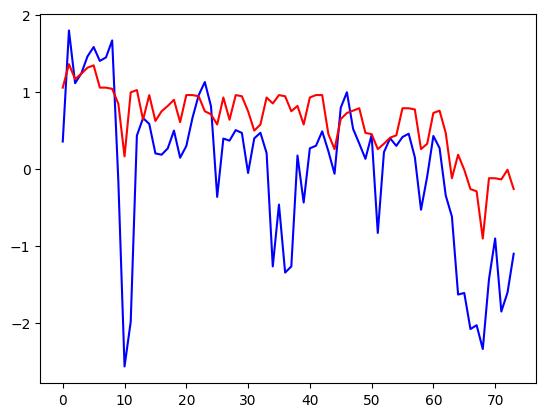

In [ ]:
p_test = m.predict(x_test)

plt.plot(y_test_s, color='blue')
plt.plot(p_test, color='red')
plt.show()

In [ ]:
# let's analyze one of the layers so see the correlations between
# the categorical values

layer = m.get_layer('mnth')
weights = layer.get_weights()[0]
for i in range(1, weights.shape[0]):
  u = weights[i]
  u = u / np.linalg.norm(u)
  print(i)
  for j in range(1, weights.shape[0]):
    v = weights[j]
    v = v / np.linalg.norm(v)
    print('    ', j, np.dot(u, v))

1
     1 1.0
     2 0.97780347
     3 0.9623376
     4 0.81213033
     5 -0.9570468
     6 -0.9829775
     7 -0.90250194
     8 -0.96380466
     9 -0.9804313
     10 -0.98096967
     11 0.8417634
     12 0.95776707
2
     1 0.97780347
     2 1.0
     3 0.9433434
     4 0.81511027
     5 -0.9209007
     6 -0.9852647
     7 -0.9118137
     8 -0.95992684
     9 -0.991089
     10 -0.93980426
     11 0.85059214
     12 0.92475086
3
     1 0.9623376
     2 0.9433434
     3 1.0
     4 0.77907324
     5 -0.92259884
     6 -0.9351683
     7 -0.8553741
     8 -0.9137195
     9 -0.95234054
     10 -0.92716056
     11 0.7868609
     12 0.9392639
4
     1 0.81213033
     2 0.81511027
     3 0.77907324
     4 1.0
     5 -0.79926556
     6 -0.8598093
     7 -0.55885
     8 -0.84618104
     9 -0.8134049
     10 -0.81614286
     11 0.6082875
     12 0.8679816
5
     1 -0.9570468
     2 -0.9209007
     3 -0.92259884
     4 -0.79926556
     5 1.0
     6 0.9164594
     7 0.7995036
     8 0.95476174
     9

In [ ]:
# let's create a new dataframe with the embedding values
x_new = df[['temp', 'hum', 'windspeed']].values
for i in range(len(df_emb_vars)):
    values = df[df_emb_vars[i]].values
    layer = m.get_layer(df_emb_vars[i])
    weights = layer.get_weights()[0]
    emb_values = weights[values]
    x_new = np.concatenate([x_new, emb_values], axis=-1)

In [ ]:
x_new.shape

(731, 29)

In [ ]:
train_size = int(0.9 * len(x_new))

x_train = x_new[:train_size]
y_train = y[:train_size]
x_test = x_new[train_size:]
y_test = y[train_size:]
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((657, 29), (657,), (74, 29), (74,))

In [ ]:
# create your model here
gb_model = xg.XGBRegressor(objective="reg:squarederror", random_state=42)

In [ ]:
gb_model.fit(x_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
p_test = gb_model.predict(x_test)

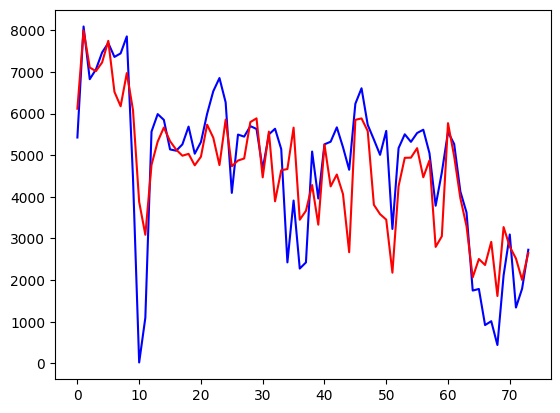

In [ ]:
plt.plot(y_test, color='blue')
plt.plot(p_test, color='red')
plt.show()

Which model performed best? the GB model or the DL model?

The Gradient Boosting model performed better than the Deep Learning model, as the predicted values follow the actual values more closely in the GB model than the DL model.